<a href="https://colab.research.google.com/github/sandeshar/google/blob/main/WGAN-GP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import torch
import torch.optim as optim
import torch.nn as nn
from torch.utils.data import DataLoader
from torchvision import datasets,transforms
import matplotlib.pyplot as plt
from torchvision.utils import make_grid

bs = 64

In [ ]:
!mkdir -p ~/.kaggle
!mkdir -p ~/images
!mkdir -p ~/checkpoint
!cp kaggle.json ~/.kaggle/
!chmod 600 /root/.kaggle/kaggle.json
!kaggle datasets download -d karnikakapoor/art-portraits
!unzip art-portraits.zip -d images

art-portraits.zip: Skipping, found more recently modified local copy (use --force to force download)
Archive:  art-portraits.zip
replace images/Portraits/000c6828b825f032af6047b46eba2686c.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [ ]:
generator = nn.Sequential(
nn.ConvTranspose2d(100,bs*16,4,2,0),
nn.BatchNorm2d(bs*16),
nn.ReLU(),
nn.ConvTranspose2d(bs*16,bs*8,4,2,1),
nn.BatchNorm2d(bs*8),
nn.ReLU(),
nn.ConvTranspose2d(bs*8,bs*4,4,2,1),
nn.BatchNorm2d(bs*4),
nn.ReLU(),
nn.ConvTranspose2d(bs*4,bs*2,4,2,1),
nn.BatchNorm2d(bs*2),
nn.ReLU(),
nn.ConvTranspose2d(bs*2,3,kernel_size=4,stride=2,padding=1),
nn.Tanh(),
)

In [ ]:
discriminator = nn.Sequential(
nn.Conv2d(3,bs,4,2,1),
nn.LeakyReLU(0.02),
nn.Conv2d(bs,bs*2,4,2,1),
nn.InstanceNorm2d(bs*2,affine=True),
nn.LeakyReLU(0.02),
nn.Conv2d(bs*2,bs*4,4,2,1),
nn.InstanceNorm2d(bs*4,affine=True),
nn.LeakyReLU(0.02),
nn.Conv2d(bs*4,bs*8,4,2,1),
nn.InstanceNorm2d(bs*8,affine=True),
nn.LeakyReLU(0.02),
nn.Conv2d(bs*8,1,4,2,0),
)

In [ ]:
##########Hyperparameters#########
lr = 1e-4
epochs = 200
CRITIC_ITERATIONS = 5
LAMBDA_GP = 10

device = "cuda" if torch.cuda.is_available() else "cpu"

gen = generator.to(device)
critic = discriminator.to(device)
opt_gen = optim.Adam(gen.parameters(), lr=lr, betas=(0.0, 0.9))
opt_critic = optim.Adam(critic.parameters(), lr=lr, betas=(0.0, 0.9))

stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)
transform = transforms.Compose([
     transforms.Resize(64),
     transforms.CenterCrop(64),
     transforms.ToTensor(),
     transforms.Normalize((0.5,0.5,0.5),(0.5,0.5,0.5))
])
data = datasets.ImageFolder('images', transform=transform)
loader = DataLoader(data,shuffle=True,batch_size=64,num_workers=2)

In [ ]:
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    images = images.cpu()
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))
    plt.pause(0.005)

def weight_init(m):
    # weight_initialization: important for wgan
    class_name=m.__class__.__name__
    if class_name.find('Conv')!=-1:
        m.weight.data.normal_(0,0.02)
    elif class_name.find('Norm')!=-1:
        m.weight.data.normal_(1.0,0.02)

gen.apply(weight_init)
critic.apply(weight_init)

def save(gen,critic,epoch):
    state = {
      'gsd':gen.state_dict(),
      'dsd':critic.state_dict(),
            }
    path = "drive/MyDrive/Model/model"+str(epoch)+".pt"
    torch.save(state,path)

def load():
  checkpoint = torch.load('drive/MyDrive/Model/model10.pt')
  gen.load_state_dict(checkpoint['gsd'])
  critic.load_state_dict(checkpoint['dsd'])

In [ ]:
def gradient_penalty(critic, real, fake, device="cpu"):
    BATCH_SIZE, C, H, W = real.shape
    alpha = torch.rand((BATCH_SIZE, 1, 1, 1)).repeat(1, C, H, W).to(device)
    interpolated_images = real * alpha + fake * (1 - alpha)

    # Calculate critic scores
    mixed_scores = critic(interpolated_images)

    # Take the gradient of the scores with respect to the images
    gradient = torch.autograd.grad(
        inputs=interpolated_images,
        outputs=mixed_scores,
        grad_outputs=torch.ones_like(mixed_scores),
        create_graph=True,
        retain_graph=True,
    )[0]
    gradient = gradient.view(gradient.shape[0], -1)
    gradient_norm = gradient.norm(2, dim=1)
    gradient_penalty = torch.mean((gradient_norm - 1) ** 2)
    return gradient_penalty

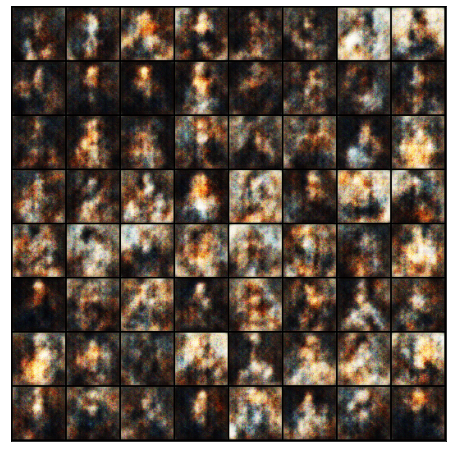

Epoch [0/200] Batch 10/65                   Loss D: -17.1757, loss G: 45.5615


/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


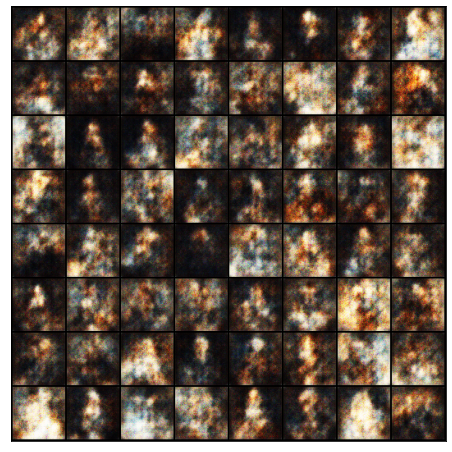

Epoch [0/200] Batch 20/65                   Loss D: -16.9543, loss G: 45.5421


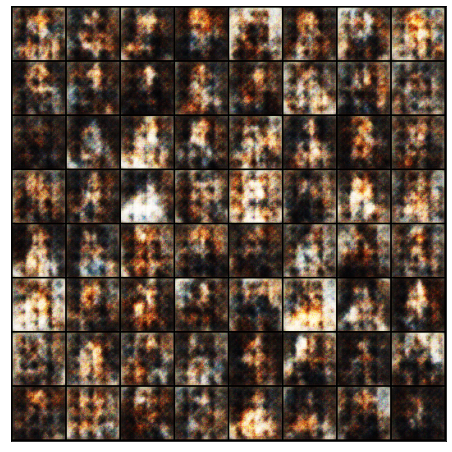

Epoch [0/200] Batch 30/65                   Loss D: -19.7665, loss G: 44.0188


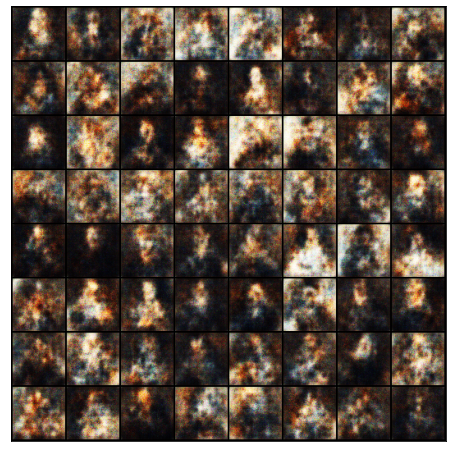

Epoch [0/200] Batch 40/65                   Loss D: -17.2258, loss G: 45.4161


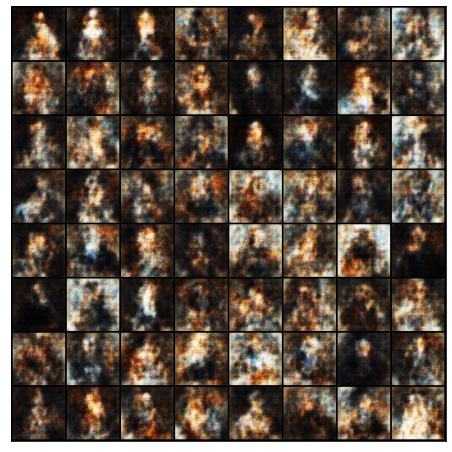

Epoch [0/200] Batch 50/65                   Loss D: -16.5383, loss G: 47.0966


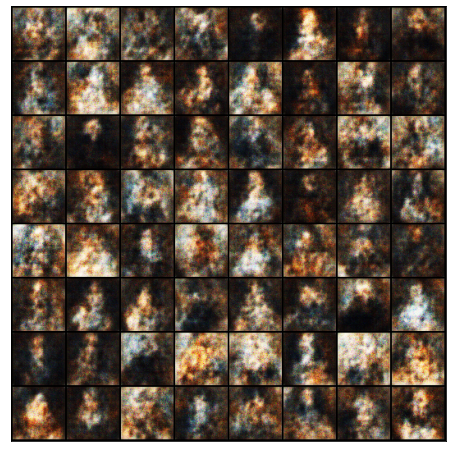

Epoch [0/200] Batch 60/65                   Loss D: -17.5188, loss G: 47.5259


/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


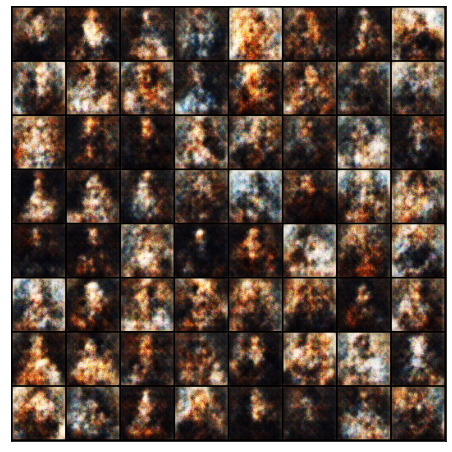

Epoch [1/200] Batch 10/65                   Loss D: -17.5109, loss G: 47.7248


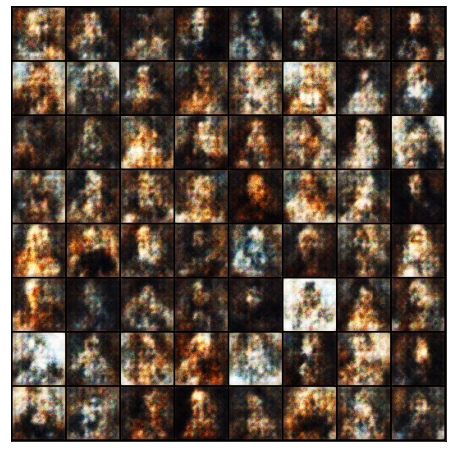

Epoch [1/200] Batch 20/65                   Loss D: -13.2935, loss G: 46.6794


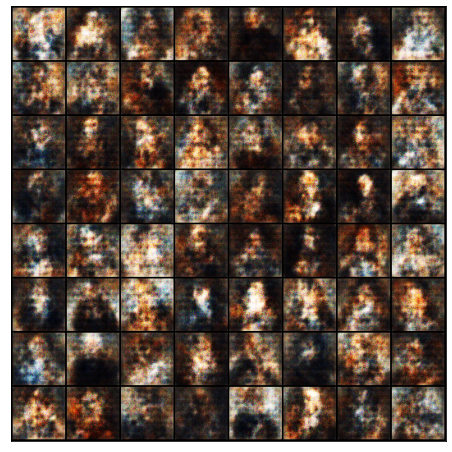

Epoch [1/200] Batch 30/65                   Loss D: -16.4166, loss G: 46.0158


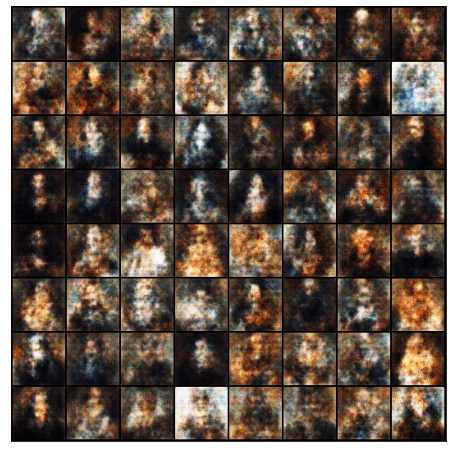

Epoch [1/200] Batch 40/65                   Loss D: -17.6075, loss G: 50.6027


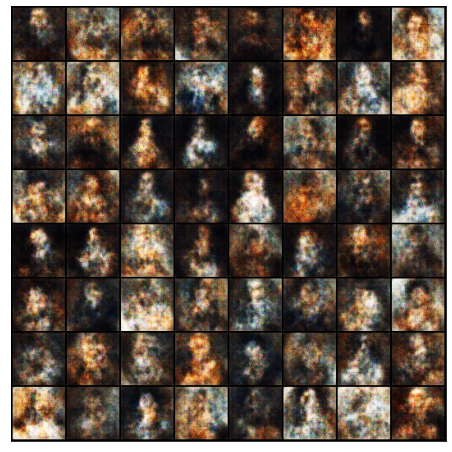

Epoch [1/200] Batch 50/65                   Loss D: -15.2653, loss G: 53.3735


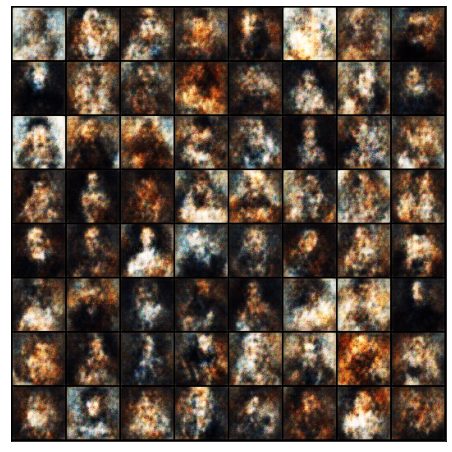

Epoch [1/200] Batch 60/65                   Loss D: -17.3794, loss G: 55.6490


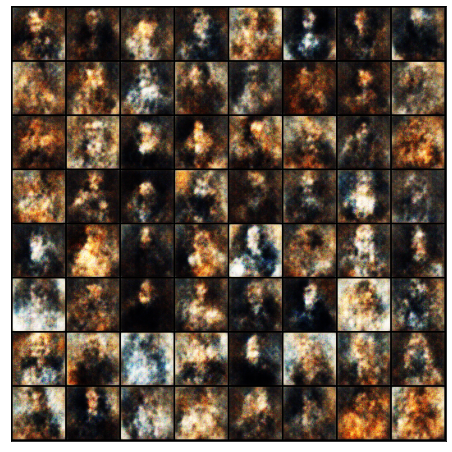

Epoch [2/200] Batch 10/65                   Loss D: -15.6626, loss G: 52.5587


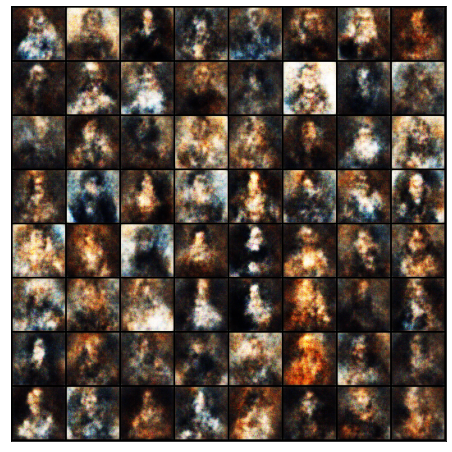

Epoch [2/200] Batch 20/65                   Loss D: -12.6690, loss G: 52.4992


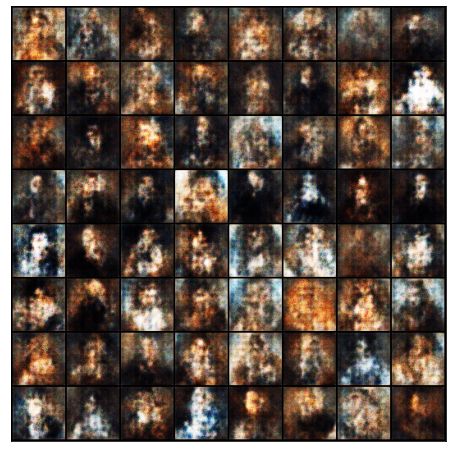

Epoch [2/200] Batch 30/65                   Loss D: -14.3438, loss G: 52.3474


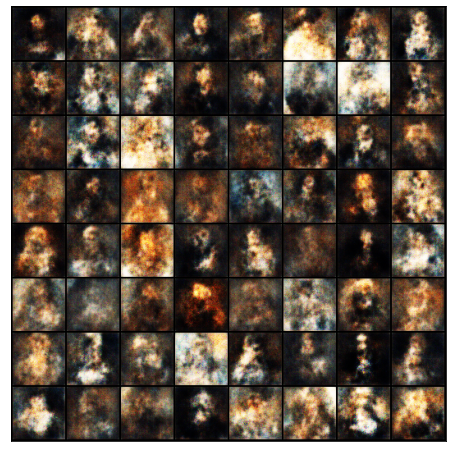

Epoch [2/200] Batch 40/65                   Loss D: -16.7201, loss G: 53.7342


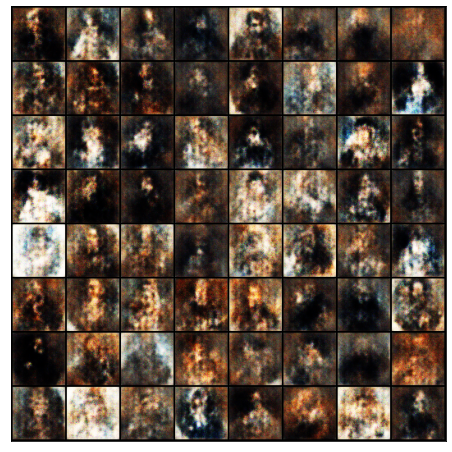

Epoch [2/200] Batch 50/65                   Loss D: -12.3237, loss G: 50.5246


/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


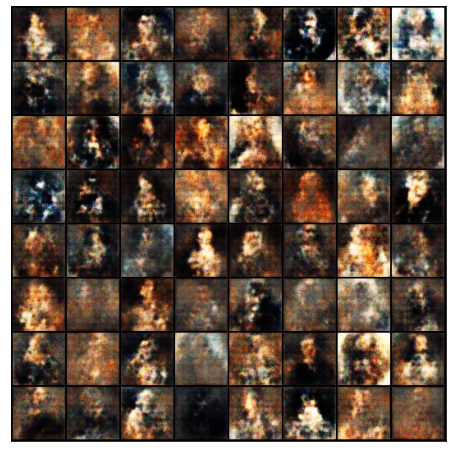

Epoch [2/200] Batch 60/65                   Loss D: -15.3765, loss G: 47.7647


/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


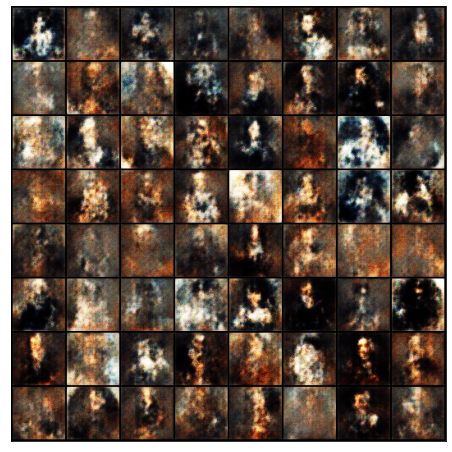

Epoch [3/200] Batch 10/65                   Loss D: -13.0590, loss G: 46.3325


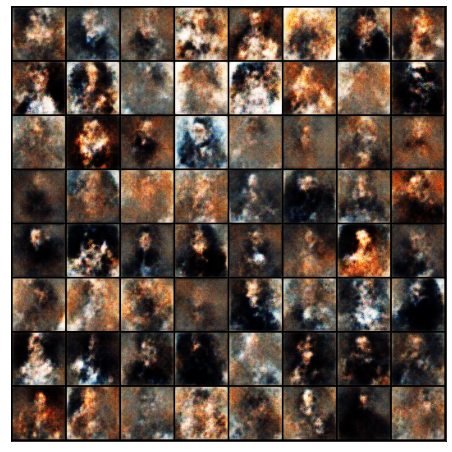

Epoch [3/200] Batch 20/65                   Loss D: -14.1086, loss G: 45.1049


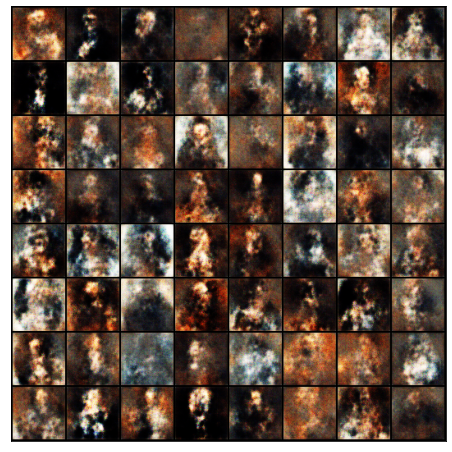

Epoch [3/200] Batch 30/65                   Loss D: -15.2213, loss G: 49.7610


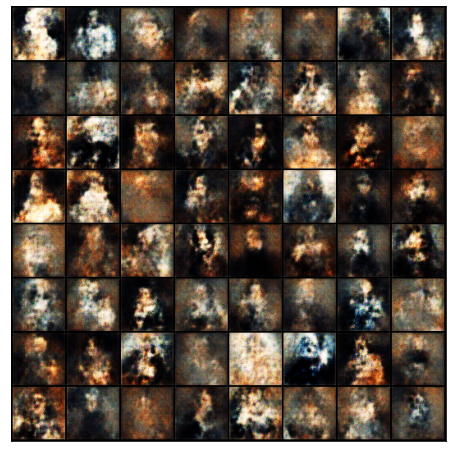

Epoch [3/200] Batch 40/65                   Loss D: -13.5710, loss G: 40.6495


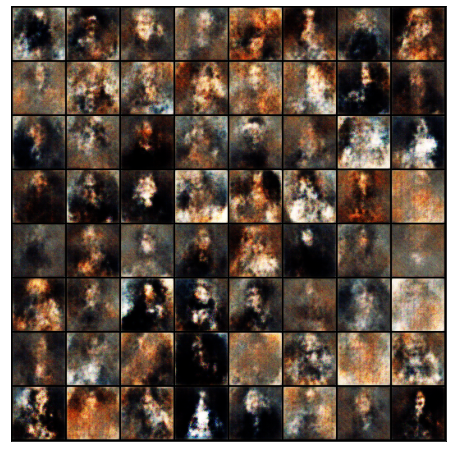

Epoch [3/200] Batch 50/65                   Loss D: -14.0007, loss G: 48.1156


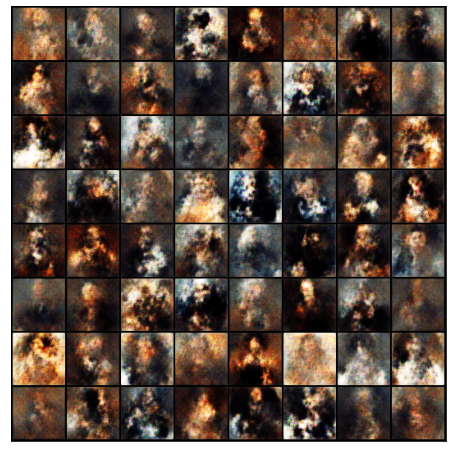

Epoch [3/200] Batch 60/65                   Loss D: -17.2507, loss G: 53.7431


/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


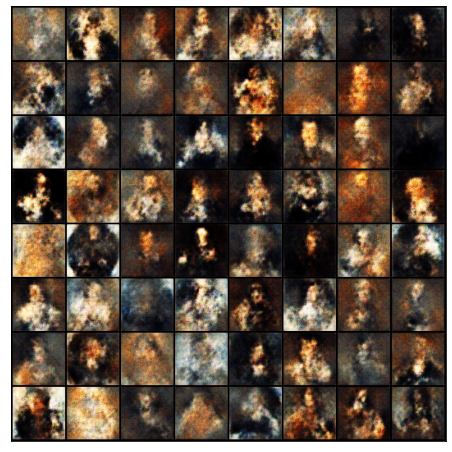

Epoch [4/200] Batch 10/65                   Loss D: -13.5193, loss G: 48.4981


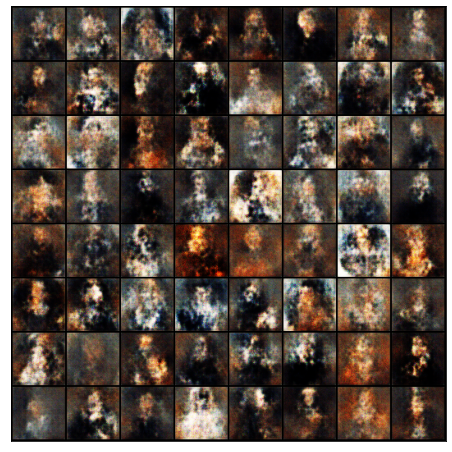

Epoch [4/200] Batch 20/65                   Loss D: -16.2652, loss G: 52.1266


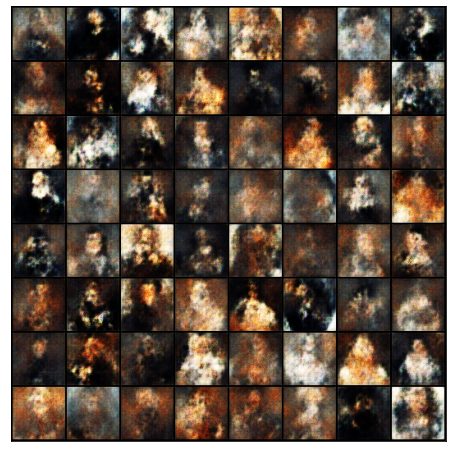

Epoch [4/200] Batch 30/65                   Loss D: -14.9621, loss G: 51.9181


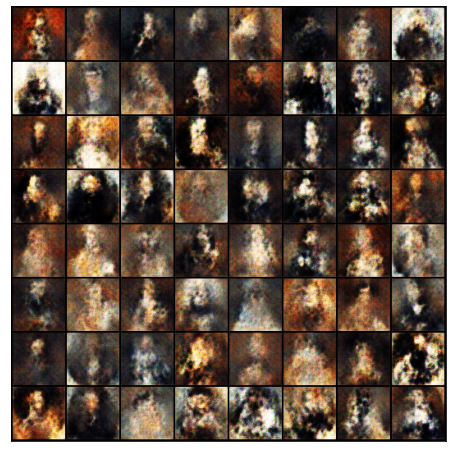

Epoch [4/200] Batch 40/65                   Loss D: -12.3261, loss G: 49.7558


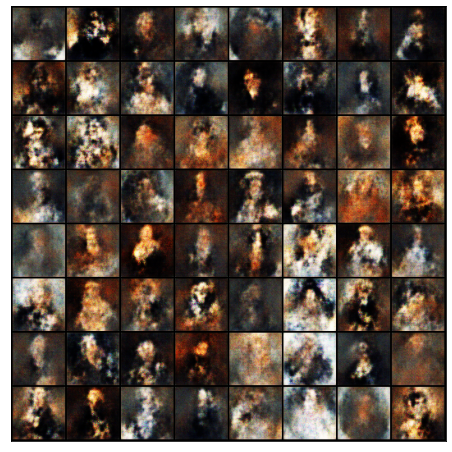

Epoch [4/200] Batch 50/65                   Loss D: -14.2342, loss G: 48.9537


KeyboardInterrupt: ignored

In [ ]:
#load()
gen.train()
critic.train()
for epoch in range(epochs):
    # Target labels not needed! <3 unsupervised
    for batch_idx, (real, _) in enumerate(loader):
        real = real.to(device)
        cbs = real.shape[0]

        # Train Critic: max E[critic(real)] - E[critic(fake)]
        # equivalent to minimizing the negative of that
        for _ in range(CRITIC_ITERATIONS):
            noise = torch.randn(cbs, 100, 1, 1).to(device)
            fake = gen(noise)
            critic_real = critic(real).view(-1,1,1,1)
            critic_fake = critic(fake).view(-1,1,1,1)
            gp = gradient_penalty(critic, real, fake, device=device)
            loss_critic = (
                -(torch.mean(critic_real) - torch.mean(critic_fake)) + LAMBDA_GP * gp
            )
            critic.zero_grad()
            loss_critic.backward(retain_graph=True)
            opt_critic.step()

        # Train Generator: max E[critic(gen_fake)] <-> min -E[critic(gen_fake)]
        gen_fake = critic(fake).reshape(-1)
        loss_gen = -torch.mean(gen_fake)
        gen.zero_grad()
        loss_gen.backward()
        opt_gen.step()

        # Print losses occasionally and print to tensorboard
        if batch_idx == 0:
            noise = torch.randn(cbs, 100, 1, 1).to(device)
            fake = gen(noise)
            show_images(fake)

            print(
                f"Epoch [{epoch}/200] Batch {batch_idx}/{len(loader)} \
                  Loss D: {loss_critic:.4f}, loss G: {loss_gen:.4f}"
            )
    if epoch == 5:
      save(gen,critic,epoch):